In [1]:
from uproot_io import Events, View
import numpy as np
from numpy import *
import matplotlib
import matplotlib.pyplot as plt
import math
titlesize = 20
labelsize = 14

In [2]:
events = Events('/Users/mohammed/code/neutrinos-dune-files/CheatedRecoFile_1.root')

In [3]:
testing = np.load("testing_events.npy")
ratioclosetrk = np.load("ratioclose_trk.npy")
ratiocloseshw = np.load("ratioclose_shw.npy")
connecttrk = np.load("connect_trk.npy")
connectshw = np.load("connect_shw.npy")
energytrk = np.load("energy_trk.npy")
energyshw = np.load("energy_shw.npy")
variencetrk = np.load("varience_trk.npy")
varienceshw = np.load("varience_shw.npy")
symmetrytrk = np.load("symmetry_trk.npy")
symmetryshw = np.load("symmetry_shw.npy")

In [4]:
def fit_line(x, y):
    A = np.vstack([x, np.ones_like(x)]).T
    m, c = np.linalg.lstsq(A, y, rcond=None)[0]
    return m, c

def calculate_residuals(x, y, m, c):
    #y_predicted = (m*x) + c
    perpdist = abs(((-m*x) + y - c) / np.sqrt(m**2 + 1))
    #residuals = np.abs(perpdist - y_predicted)
    return perpdist

def coords(event_number):
    idx = np.where(events.event_number == event_number)[0]
    gradients = []
    intercepts = []
    particleType = []
    ratio = []
    results = []
    allSym = []
    E = []
    
    xmax = -1000
    xmin = 1000
    zmax = -1000
    zmin = 1000
    for i in idx:
        x0 = events.reco_hits_x_w[i]
        z0 = events.reco_hits_w[i]
        if len(x0) > 0:
            if max(x0) >= xmax:
                xmax = max(x0)
            if min(x0) <= xmin:
                xmin = min(x0)
        if len(z0) > 0:
            if max(z0) >= zmax:
                zmax = max(z0)
            if min(z0) <= zmin:
                zmin = min(z0)

    xlen = 0.1*(xmax - xmin)
    zlen = 0.1*(zmax - zmin)
    
    for i in idx:
        x = events.reco_hits_x_w[i]
        z = events.reco_hits_w[i]
        pdg = events.mc_pdg[i]
        purity = events.purity[i]
        complete = events.completeness[i]
        
        adc = events.reco_adcs_w[i]
        vx = events.reco_particle_vtx_x[i]
        vz = events.reco_particle_vtx_w[i]
        
        if len(x) > 10 and pdg != 0 and purity > 0.75 and complete > 0.75:
            #particleType.append(pdg)
            
            best_inliers = []
            best_model = None
            sample_size = 10
            max_iterations = 100

            for _ in range(max_iterations):
                sample_size = min(sample_size, len(x))
                sample_indices = np.random.choice(len(x), size=sample_size, replace=False)
                x_sample = x[sample_indices]
                z_sample = z[sample_indices]

                m, c = fit_line(x_sample, z_sample)
                residuals = calculate_residuals(x, z, m, c)
                inliers = np.where(residuals < (0.15*xlen))[0]

                if len(inliers) > len(best_inliers):
                    best_inliers = inliers
                    best_model = (m, c)

            if len(best_inliers) > 0:
                m, c = best_model
                gradients.append(m)
                intercepts.append(c)
                particleType.append(pdg)
                
                znew = z - c
                angle = -math.atan(m)
                l = x * np.cos(angle) - znew * np.sin(angle)
                t = x * np.sin(angle) + znew * np.cos(angle)

                
                tdiff = np.abs(max(t)-min(t))
                margin = tdiff*0.05
                inside = [x for x in t if x <= margin and x >= -margin]
                ratio.append(len(inside)/len(t))
                
                
                p1 = int(0.7 * len(t))
                X = t[p1:]
                Xvar = np.var(X)
                
                p2 = int(0.3 * len(t))
                Y = t[:p2]
                Yvar = np.var(Y)
                
                if  Yvar > Xvar:
                    resultY = np.sqrt(Yvar)
                    results.append(resultY)           
                else:
                    resultX = np.sqrt(Xvar)
                    results.append(resultX)
                
                
                above = np.sum(t > 0)
                below = np.sum(t < 0)
                
                lmin, lmax = np.min(l), np.max(l)
                length = lmax - lmin

                if above == 0 or below == 0 or length == 0:
                    allSym.append(2)
                    
                else:
                    # If symmetric, this should be close to 1, otherwise > 1
                    sym = (above + below) / length
                    allSym.append(sym)
            
                
                vznew = vz - c
                
                vl = vx * np.cos(angle) - vznew * np.sin(angle)
                vt = vx * np.sin(angle) + vznew * np.cos(angle)
                
                if max(l) < vl:
                    l *= -1
                    
                combined = list(zip(l, t, adc))
                sort = sorted(combined, key = lambda coord: coord[0])
                
                lnew, tnew, adcnew = zip(*sort)
                
                percent = int(0.9 * len(adcnew))
                X = adcnew[percent:]
                Xsum = np.sum(X)

                total = np.sum(adcnew)
                result = Xsum / total

                E.append(result)
            
            else:
                ratio.append(0.1)
                results.append(1.5)
                allSym.append(2)
                E.append(0.25)
                particleType.append(pdg)
    
    return particleType, ratio, results, allSym, E

In [5]:
def connectiondist(event_number):
    totals = []
    parts = []
    
    idx = np.where(events.event_number == event_number)[0]
    newidx = idx - idx[0]
    for i in newidx:
        x = events.reco_hits_x_w[i+idx[0]]
        z = events.reco_hits_w[i+idx[0]]
        part = events.mc_pdg[i+idx[0]]
        purity = events.purity[i+idx[0]]
        complete = events.completeness[i+idx[0]]
        
        if len(x) > 10 and part != 0 and purity > 0.75 and complete > 0.75:
            total_distance = 0.0
            for j in range(len(x) - 1):
                distance = np.sqrt((x[j+1] - x[j])**2 + (z[j+1] - z[j])**2)
                total_distance += distance
            meandist = total_distance/(len(x)-1)
            totals.append(meandist)
            parts.append(part)
    
    return np.array(totals), np.array(parts)

In [6]:
def energy(event_number):    
    particleType = np.array([])
    E = np.array([])
    
    idx = np.where(events.event_number == event_number)[0]
    for i in idx:
        x = events.reco_hits_x_w[i]
        z = events.reco_hits_w[i]
        adc = events.reco_adcs_w[i]        
        purity = events.purity[i]
        complete = events.completeness[i]
        pdg = events.mc_pdg[i]
        
        if len(x) > 10 and pdg != 0 and purity > 0.75 and complete > 0.75:
            percent = int(0.8 * len(adc))
            X = adc[percent:]
            Xsum = np.sum(X)
            
            total = np.sum(adc)
            result = Xsum / total
            
            if result != 1.0:
                E = np.append(E, result)
                particleType = np.append(particleType, pdg) 
            
    #return E, particleType

In [7]:
e = 3795

part, ratio, results, allSym, vol = coords(e)
total, _ = connectiondist(e)

In [8]:
b = 2
part[b], ratio[b], results[b], allSym[b], vol[b], total[b]

(-211,
 0.676923076923077,
 3.4333894,
 2.2646099408414884,
 0.07307846,
 1.1551463639143074)

In [9]:
def likelihood():
    #trackprob = []
    #showerprob = []
    particle = []
    
    TIT = []
    TIS = []
    SIS = []
    SIT = []
    
    SHWevent = []
    SHWparticleNo = []
    
    TRKevent = []
    TRKparticleNo = []
    
    ratiobin = np.arange(0, 1, 0.05)
    totalbin = np.arange(0, 15, 0.5)
    volbin = np.arange(0, 0.5, 0.025)
    resultsbin = np.arange(0, 10, 0.5)
    allSymbin = np.arange(0, 10, 0.5)
    
    for n in testing:
        
        # n is the event number
        # i is the particle number in the event
        
        part, ratio, results, allSym, vol = coords(n)
        total, _ = connectiondist(n)
        
        for i in range(len(part)):
            bin1 = np.searchsorted(ratiobin, ratio[i], side='right') - 1
            bin2 = np.searchsorted(totalbin, total[i], side='right') - 1
            bin3 = np.searchsorted(volbin, vol[i], side='right') - 1
            bin4 = np.searchsorted(resultsbin, results[i], side='right') - 1
            bin5 = np.searchsorted(allSymbin, allSym[i], side='right') - 1
            
            trk1 = ratioclosetrk[bin1]
            trk2 = connecttrk[bin2]
            trk3 = energytrk[bin3]
            trk4 = variencetrk[bin4]
            trk5 = symmetrytrk[bin5]
            trackprob = (trk1*trk2*trk3*trk4*trk5)

            shw1 = ratiocloseshw[bin1]
            shw2 = connectshw[bin2]
            shw3 = energyshw[bin3]
            shw4 = varienceshw[bin4]
            shw5 = symmetryshw[bin5]
            showerprob = (shw1*shw2*shw3*shw4*shw5)
            
            TRKlike = trackprob/(trackprob+showerprob)
            SHWlike = showerprob/(trackprob+showerprob)
            particle.append(part)
            
            if part[i] == 22. or part[i] == -11. or part[i] == 11.:
                SIS.append(SHWlike)
                SIT.append(TRKlike)
                
                if TRKlike > 0.9:
                    
                    # Should be showers, called tracks
                    SHWevent.append(n)
                    SHWparticleNo.append(i)
                
            else:
                TIS.append(SHWlike)
                TIT.append(TRKlike)
                
                if SHWlike > 0.9:
                    # Should be tracks, called showers
                    TRKevent.append(n)
                    TRKparticleNo.append(i)
            
    return TIT, TIS, SIS, SIT, TRKevent, TRKparticleNo, SHWevent, SHWparticleNo

In [10]:
TIT, TIS, SIS, SIT, TRKevent, TRKparticleNo, SHWevent, SHWparticleNo = likelihood()

/var/folders/0j/k5n00ph57w3c1tdfq0lwsgn00000gn/T/ipykernel_49392/3054806838.py:52: RuntimeWarning: invalid value encountered in scalar divide
  TRKlike = trackprob/(trackprob+showerprob)
/var/folders/0j/k5n00ph57w3c1tdfq0lwsgn00000gn/T/ipykernel_49392/3054806838.py:53: RuntimeWarning: invalid value encountered in scalar divide
  SHWlike = showerprob/(trackprob+showerprob)


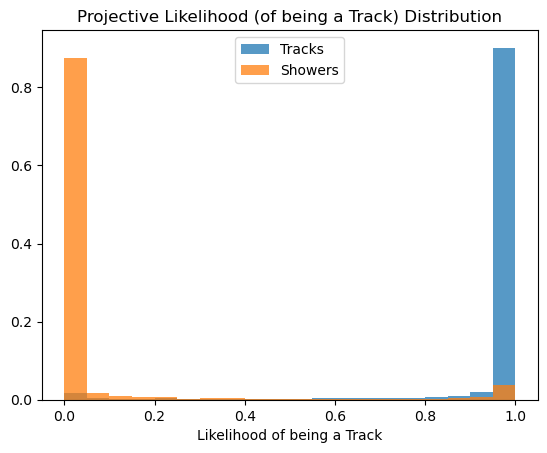

In [11]:
bin_edges = np.arange(0, 1.05, 0.05)

# hist1, _ = np.histogram(SIS, bins=bin_edges)
# hist2, _ = np.histogram(TIS, bins=bin_edges)
   
# hist1_normalized = hist1 / len(SIS)
# hist2_normalized = hist2 / len(TIS)

# plt.bar(bin_edges[:-1], hist2_normalized, width=0.05, align='edge', alpha=0.75, label='Tracks')
# plt.bar(bin_edges[:-1], hist1_normalized, width=0.05, align='edge', alpha=0.75, label='Showers')
# plt.title('Projective Likelihood (of being a Shower) Distribution')
# plt.xlabel('Likelihood of being a Shower')
# plt.legend(loc='upper center')
# plt.show()

hist2, _ = np.histogram(TIT, bins=bin_edges)
hist1, _ = np.histogram(SIT, bins=bin_edges)

hist2_normalized = hist2 / len(TIT)
hist1_normalized = hist1 / len(SIT)

plt.bar(bin_edges[:-1], hist2_normalized, width=0.05, align='edge', alpha=0.75, label='Tracks')
plt.bar(bin_edges[:-1], hist1_normalized, width=0.05, align='edge', alpha=0.75, label='Showers')
plt.title('Projective Likelihood (of being a Track) Distribution')
plt.xlabel('Likelihood of being a Track')
plt.legend(loc='upper center')
plt.show()

In [12]:
len(TRKevent), len(TRKparticleNo), len(SHWevent), len(SHWparticleNo)

(192, 192, 217, 217)

In [13]:
TRKevent, TRKparticleNo

([4287,
  7769,
  3826,
  8451,
  6618,
  5901,
  2165,
  6927,
  18,
  758,
  105,
  7213,
  4716,
  5245,
  5245,
  217,
  4024,
  3751,
  4397,
  5506,
  4166,
  7739,
  131,
  6453,
  6453,
  5207,
  5656,
  5656,
  5909,
  3795,
  5711,
  3375,
  3375,
  1869,
  1869,
  1869,
  8673,
  2357,
  6529,
  4191,
  6892,
  8372,
  4829,
  7191,
  4790,
  1574,
  2921,
  6563,
  104,
  5633,
  12,
  12,
  12,
  6628,
  5428,
  4464,
  3803,
  3803,
  1050,
  5875,
  5186,
  956,
  1651,
  1651,
  3835,
  5661,
  5681,
  5036,
  1055,
  2105,
  217,
  131,
  8,
  8,
  7555,
  2180,
  8295,
  4080,
  9205,
  8931,
  7952,
  6374,
  7385,
  3902,
  4378,
  5656,
  5656,
  7510,
  8372,
  6292,
  5184,
  2939,
  8209,
  8879,
  5943,
  2304,
  5943,
  7975,
  5164,
  2094,
  8139,
  5451,
  7138,
  5512,
  1040,
  4059,
  2913,
  533,
  136,
  5512,
  6796,
  829,
  6106,
  6949,
  5489,
  7191,
  5686,
  498,
  498,
  859,
  8739,
  8739,
  2269,
  2849,
  4188,
  4024,
  7017,
  4768,
  27

In [14]:
idx = np.where(events.event_number == 6272)[0]

In [15]:
p = TRKparticleNo[0]
p

1

In [16]:
def faultyTracksAsShowers(a):
    n = TRKevent[a]
    p = TRKparticleNo[a]
    
    idx = np.where(events.event_number == n)[0]
    
    # in this idx, get the particle with index p

    for i in idx:
        x = events.reco_hits_x_w[i]
        z = events.reco_hits_w[i]
        pdg = events.mc_pdg[i]
        purity = events.purity[i]
        complete = events.completeness[i]
        
        if len(x) < 10 or pdg == 0 or purity <= 0.75 or complete <= 0.75:
            continue
        else:
            if i == idx[p]:
                plt.scatter(x, z, color='red', marker='o', s=20)
            else:
                plt.scatter(x,z, color='grey', alpha=0.5, s =0.5)
                plt.title(f"Event: {n}, Particle: {p, idx[p]}")

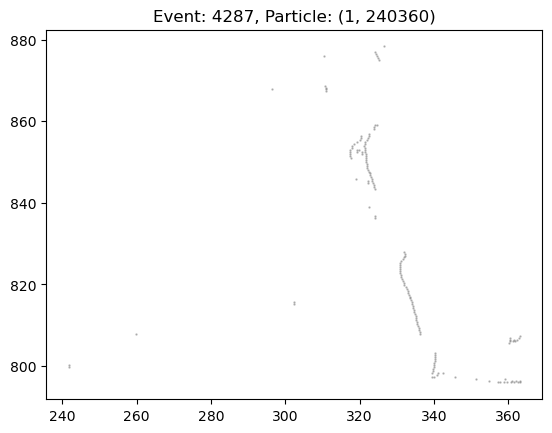

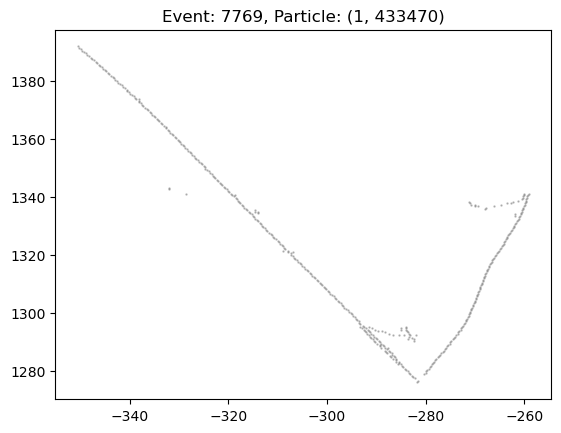

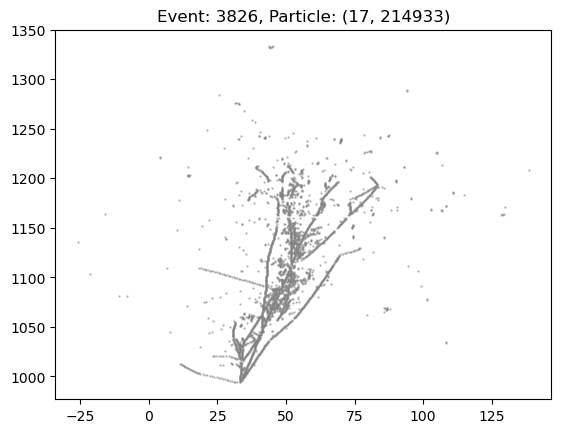

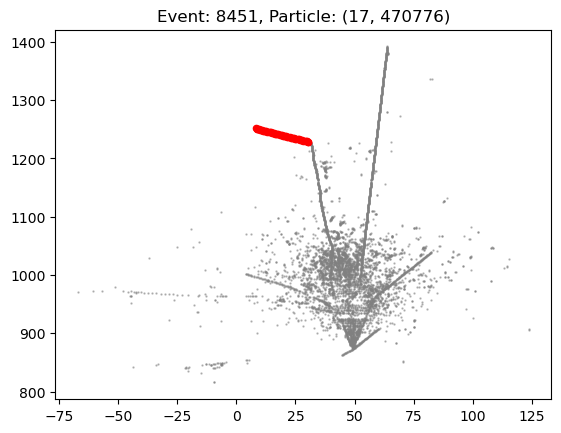

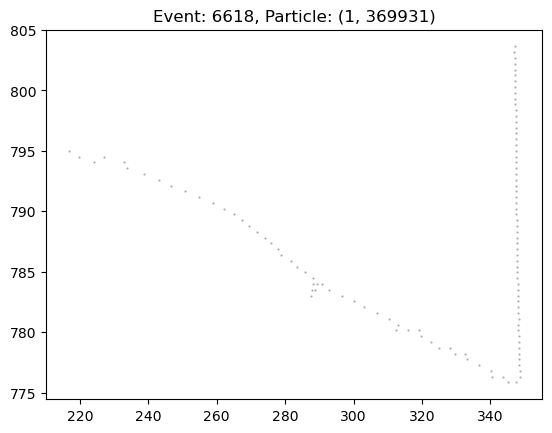

...

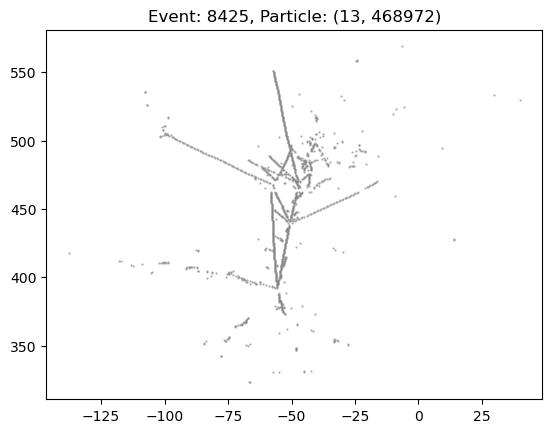

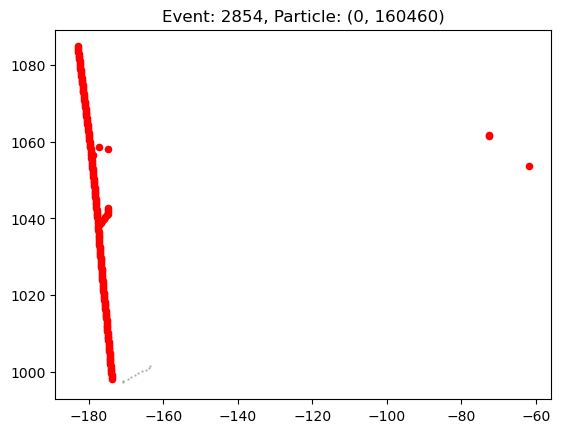

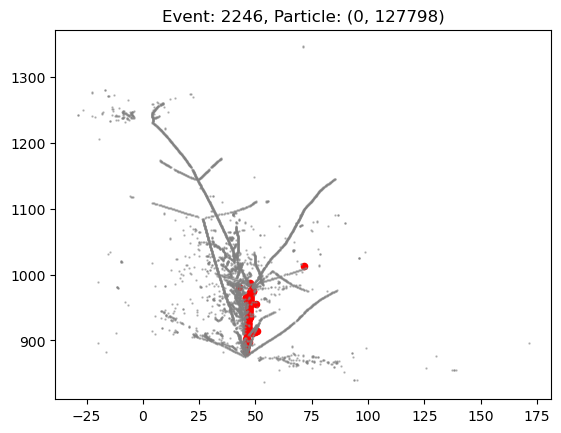

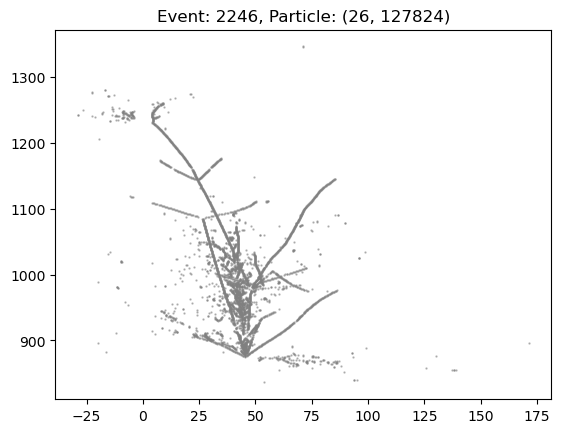

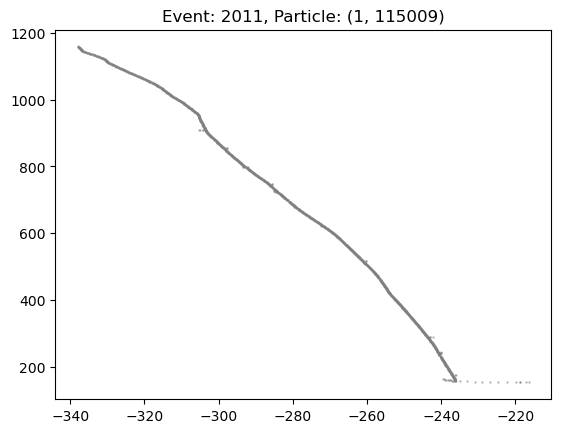

In [17]:
for a in range(len(TRKevent)):
    faultyTracksAsShowers(a)
    plt.show()  

In [18]:
def faultyShowersAsTracks(a):
    n = SHWevent[a]
    p = SHWparticleNo[a]
    
    idx = np.where(events.event_number == n)[0]
    
    # in this idx, get the particle with index p

    for i in idx:
        x = events.reco_hits_x_w[i]
        z = events.reco_hits_w[i]
        pdg = events.mc_pdg[i]
        purity = events.purity[i]
        complete = events.completeness[i]
        
        if len(x) < 10 or pdg == 0 or purity <= 0.75 or complete <= 0.75:
            continue
        else:
            if i == idx[p]:
#                 print(len(x))
                plt.scatter(x, z, color='red', marker='o', s=20)
            else:
#                 print(n, p)
                plt.scatter(x,z, color='grey', alpha=0.5, s =0.5)
                plt.title(f"Event: {n}, Particle: {p, idx[p]}")

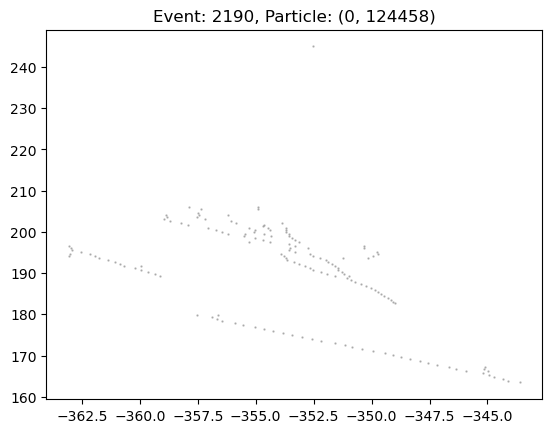

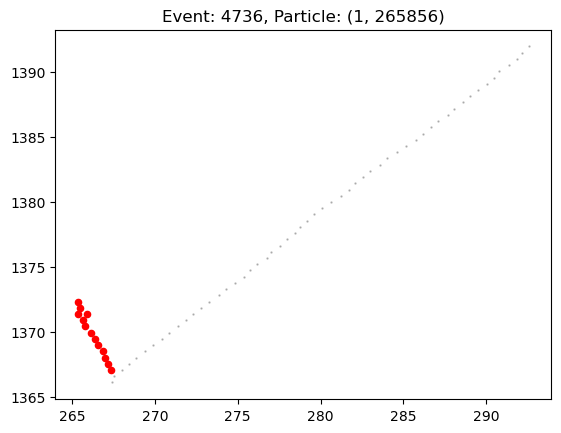

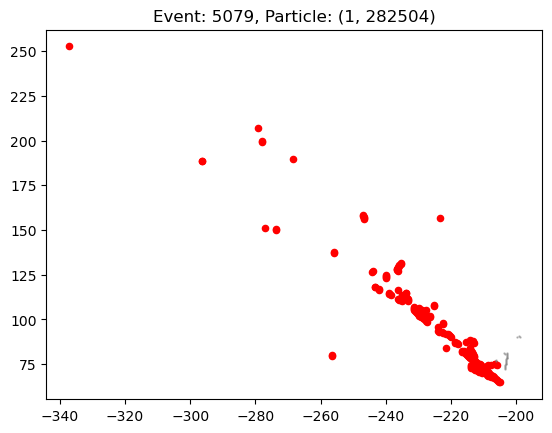

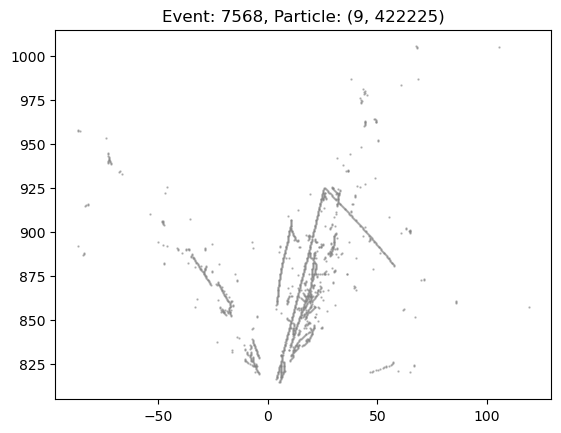

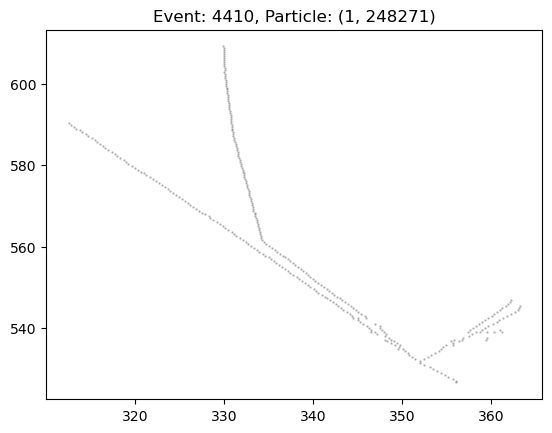

...

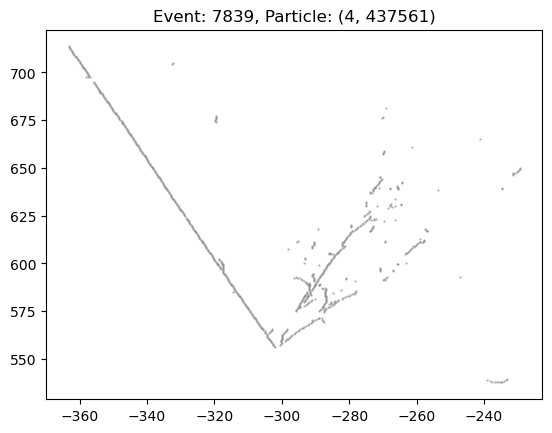

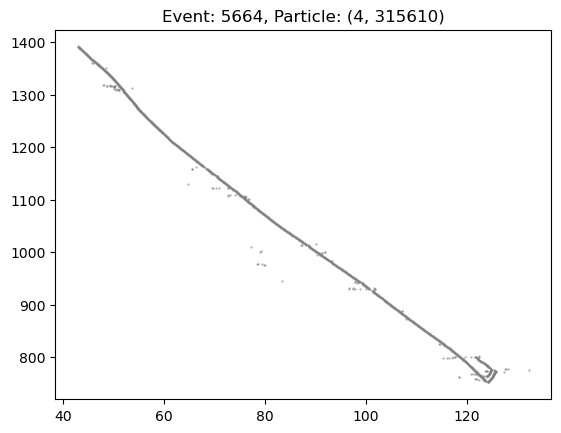

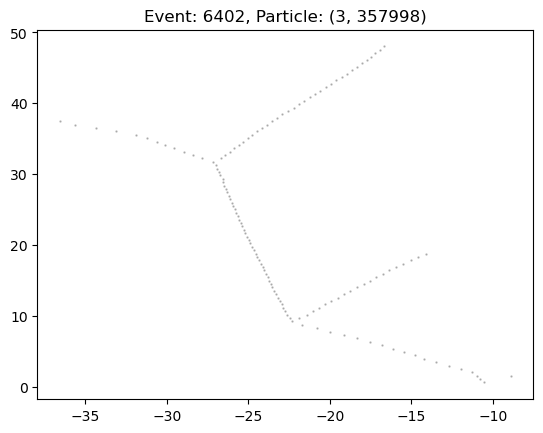

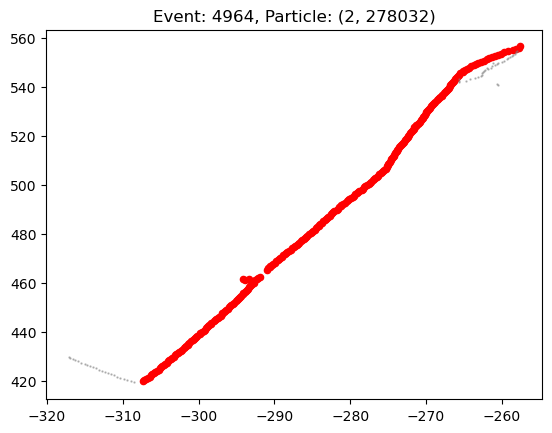

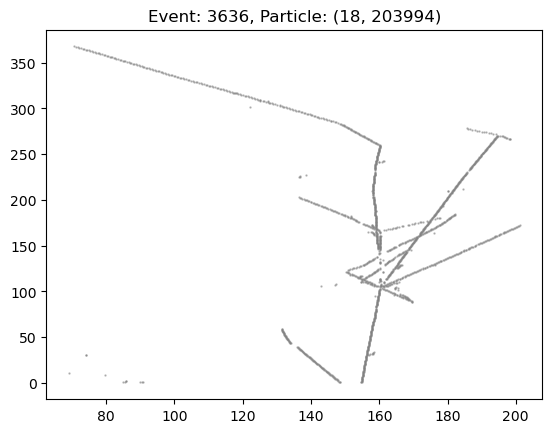

In [19]:
for a in range(len(TRKevent)):
    faultyShowersAsTracks(a)
    plt.show()  

In [30]:
def plotparticles(event_number):
    idx = np.where(events.event_number == event_number)[0]
    
    for i in idx:
        x = events.reco_hits_x_w[i]
        z = events.reco_hits_w[i]
        plt.scatter(x, z)
        plt.show()
    
#     vx = events.true_neutrino_vtx_x[idx[0]]
#     vz = events.true_neutrino_vtx_w[idx[0]]
#     plt.scatter(vx, vz, c='red', s=50)
    
#     plt.xlabel('Time')
#     plt.ylabel('W Wire')

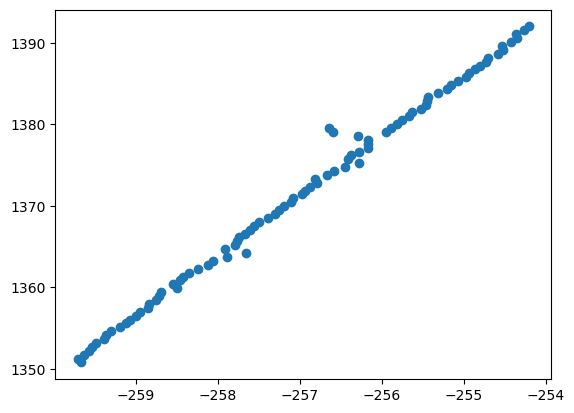

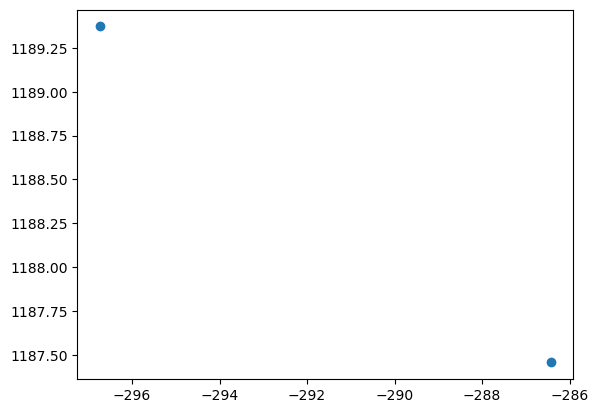

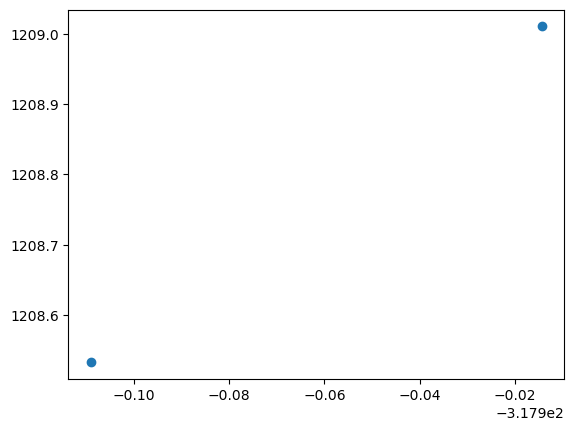

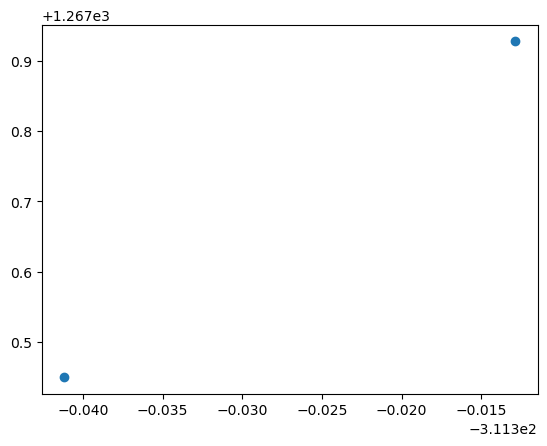

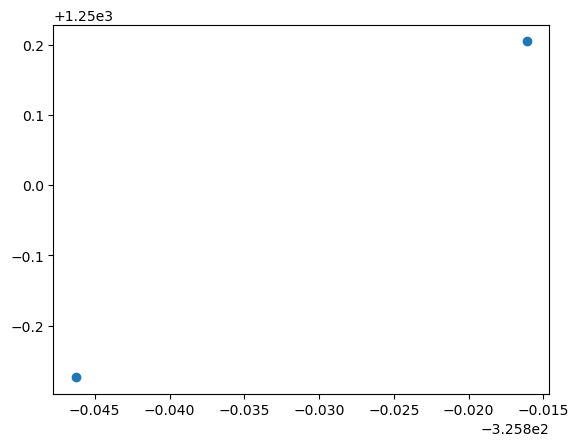

...

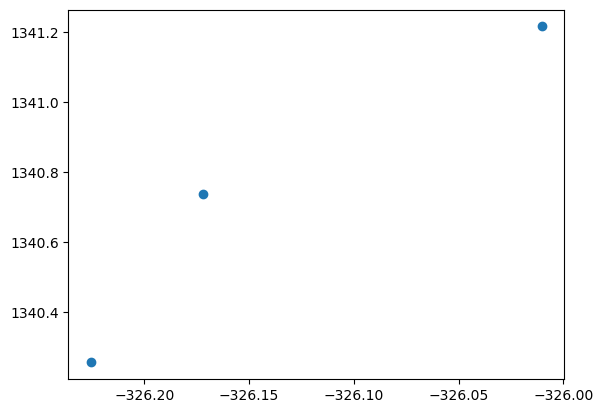

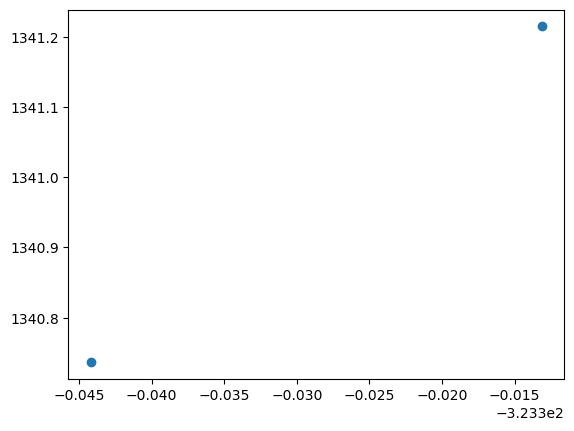

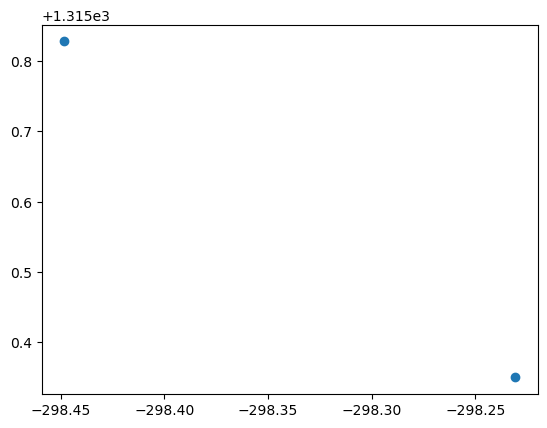

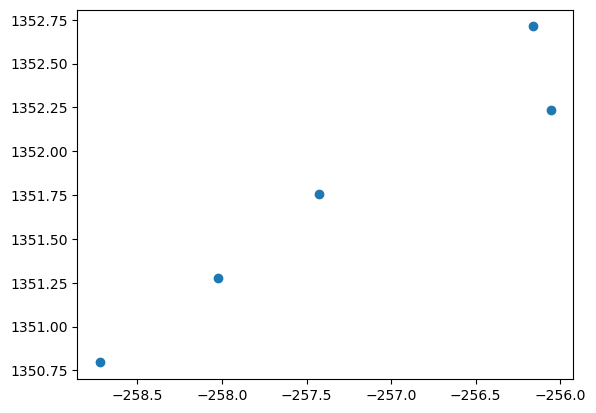

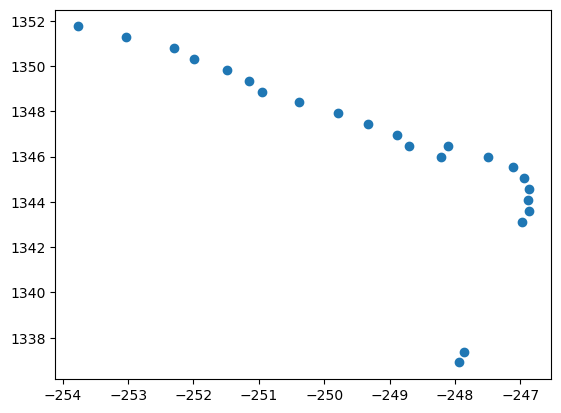

In [31]:
plotparticles(4918)

In [ ]:
# EXAMPLES THAT WORK!

